![Astrofisica Computacional](../logo.PNG)

---
## 01. Ejemplo de Solución Numérica de las ecuaciones de la Hidrodinámica

Eduard Larrañaga (ealarranaga@unal.edu.co)

---


### Resumen

Se solucionan numéricamente las ecuaciones de la hidrodinámica en un primer ejercicio simple.


---

En este ejercicio se busca resolver numéricamente la ecuación de un fluido ideal descrito por las ecuaciones

\begin{equation}
    \begin{split}
        &\frac{\partial \rho}{\partial t} +\vec{\nabla}\cdot(\rho \vec{v})=0\\
        &\rho\left(\frac{\partial \vec{v}}{\partial t}+(\vec{v}\cdot\vec{\nabla})\vec{v}\right)=-\vec{\nabla}P \\
        &P=k\rho^\gamma
    \end{split}
\end{equation}

donde $\rho$ representa la densidad de masa, $\vec{v}$ la velocidad del fluido, $P$ la presión interna y con $κ$ y $\gamma$ dos constantes que definen la ecuación de estado del fluido descrito. 


Este ejemplo particular corresponde a una distribución superifcial de materia (i.e. el problema será 2-dimensional) que se extiende en el dominio con $0\leq x \leq 10$ y $-1\leq y \leq 1$. Claramente para describir este sistema se introducen coordenadas cartesianas $(t, x, y)$ con lo que se reescribirán las ecuaciones diferenciales. Adicionalmente, se introducirá la densidad superficial de masa definida por

\begin{equation}
    \Sigma=\int_0^h\rho(t,x,y) dz,
\end{equation}

donde h el espesor de la región y se considerará como una cantidad constante. Finalmente, consideraremos un fluido incompresible, es decir $\vec{\nabla} \cdot \vec{v} = 0$.

De esta forma, las ecuaciones se escriben como un sistema diferencial para las funciones:

- Densidad supericial: $\Sigma(t,x,y)$
- Componente x de la velocidad $v^x(t,x,y)$
- Componente y de la velocidad $v^y(t,x,y)$
- Presión: $P(t,x,y)$

El resultado es el conjunto de ecuaciones

\begin{cases}
\frac{\partial \rho}{\partial t} &= - v^x \frac{\partial \rho}{\partial x} - v^y \frac{\partial \rho}{\partial y}\\
\frac{\partial v^x}{\partial t} &= - v^x \frac{\partial v^x}{\partial x} - v^y \frac{\partial v^x}{\partial y} - k \gamma \rho^{\gamma-2} \frac{\partial \rho}{\partial x} \\
\frac{\partial v^y}{\partial t} &= - v^x \frac{\partial v^y}{\partial x} - v^y \frac{\partial v^y}{\partial y} - k \gamma \rho^{\gamma-2} \frac{\partial \rho}{\partial y} \\
P &= k\rho^\gamma .
\end{cases}


La condición iniciales para la densidad superficial será

- $\Sigma(0,x,y)$ = $\frac{1}{2\sigma\sqrt{2\pi}} e^{-\frac{(x-x_0)^2 + (y-y_0)^2 }{2\sigma^2}}$


donde $x_0 = 2$, $y_0 = 0$ y $\sigma^2 = 0.5$. Adicionalmente se impondrán condiciones de frontera de outflow (gradiente cero) en la dirección veritcal y periódicas en la dirección horizontal.


----

---
## Método de Diferencias Finitas

Para resolver computacionalmente este modelo se utilizará un modelo de discretización basado en diferencias finitas. De esta forma, utilizando diferencias centradas para discretizar las derivadas espaciales en el lado derecho de las ecuaciones diferenciales se tiene


\begin{cases}
\frac{\partial \rho_{i,j}}{\partial t} &= - v^x_{i,j} \frac{\rho_{i+1,j} - \rho_{i-1,j}}{2\Delta x} - v^y_{i,j} \frac{\rho_{i,j+1} - \rho_{i,j-1}}{2\Delta y}\\
\frac{\partial v^x_{i,j}}{\partial t} &= - v^x_{i,j} \frac{v^x_{i+1,j} - v^x_{i-1,j}}{2\Delta x} - v^y_{i,j} \frac{v^x_{i,j+1} - v^x_{i,j-1}}{2\Delta y} - k \gamma \rho^{\gamma-2}_{i,j}\frac{\rho_{i+1,j} - \rho_{i-1,j}}{2\Delta x} \\
\frac{\partial v^y_{i,j}}{\partial t} &= - v^x_{i,j} \frac{v^y_{i+1,j} - v^y_{i-1,j}}{2\Delta x} - v^y_{i,j} \frac{v^y_{i,j+1} - v^y_{i,j-1}}{2\Delta y} - k \gamma \rho^{\gamma-2}_{i,j} \frac{\rho_{i,j+1} - \rho_{i,j-1}}{2\Delta y}\\
P_{i,j} &= k\rho^\gamma_{i,j} .
\end{cases}

Utilizando un esquema de derivada hacia adelante en el lado izquierdo de las ecuaciones, tendremos

\begin{cases}
\rho_{i,j}^n &= \rho_{i,j}^{n-1} - \frac{\Delta t}{2} \left[ \frac{(v^x)^n_{i,j}}{\Delta x}\left(\rho^n_{i+1,j} - \rho^n_{i-1,j} \right) + \frac{(v^y)^n_{i,j}}{\Delta y} \left( \rho^n_{i,j+1} - \rho^n_{i,j-1}\right) \right]\\
(v^x)^n_{i,j} &= (v^x)^{n-1}_{i,j} - \frac{\Delta t}{2} \left[ \frac{(v^x)^n_{i,j}}{\Delta x} \left( (v^x)^n_{i+1,j} - (v^x)^n_{i-1,j} \right) + \frac{(v^y)^n_{i,j}}{\Delta y} \left( (v^x)^n_{i,j+1} - (v^x)^n_{i,j-1}\right) + \frac{k \gamma}{\Delta x} (\rho^{\gamma-2})^n_{i,j} \left( \rho^n_{i+1,j} - \rho^n_{i-1,j} \right) \right] \\
(v^y)^n_{i,j} &= (v^y)^{n-1}_{i,j} - \frac{\Delta t}{2} \left[ \frac{(v^x)^n_{i,j}}{\Delta x} \left( (v^y)^n_{i+1,j} - (v^y)^n_{i-1,j} \right) + \frac{(v^y)^n_{i,j}}{\Delta y} \left( (v^y)^n_{i,j+1} - (v^y)^n_{i,j-1}\right) + \frac{k \gamma}{\Delta y} (\rho^{\gamma-2})^n_{i,j} \left( \rho^n_{i+1,j} - \rho^n_{i-1,j} \right) \right] \\
P_{i,j} &= k\rho^\gamma_{i,j} .
\end{cases}


---
## Ejemplo 01

En este primer ejemplo solamente evolucionaremos la función de densidad utilizando un campo de velocidades fijo



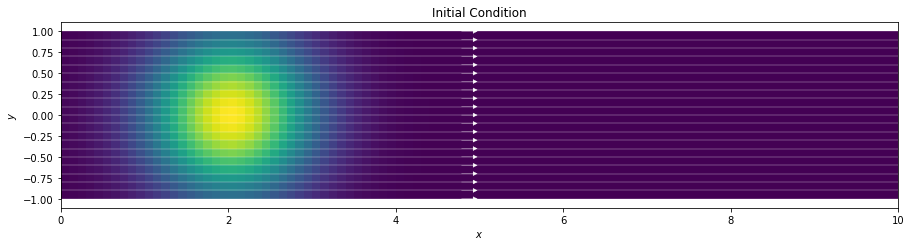

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

# In all objects, we will consider the first index as the x-component 
# and the second index as the y-component!


def gaussian2D(X, Y, x0=2., y0=0.):
    '''Initial gaussian profile for the density'''
    sigma2 = 0.5
    z = np.exp(-((X.T-x0)**2 + (Y.T-y0)**2)/(2*sigma2))
    return z

def initVel(X, Y):
    '''Constant (in time) velocity field'''
    vx0 = 10.*abs(Y.T)
    vy0 = 0.*X.T
    return np.array([vx0, vy0])


# Spatial grids
xgrid = np.linspace(0,10,100) 
ygrid = np.linspace(-1,1,20) 
X, Y = np.meshgrid(xgrid, ygrid)

# Initial Conditions
rho0 = gaussian2D(X,Y)
v0 = initVel(X,Y)


# Plot the intial condition
plt.figure(figsize=(15,10))
plt.title('Initial Condition')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')

plt.imshow(rho0.T, origin='lower', extent=[0,10,-1,1])
#plt.quiver(X, Y, v0[0], v0[1], color='white', width=0.001)
plt.streamplot(X,Y,v0[0].T,v0[1].T, density=.7, linewidth=0.3, color='white')
plt.show()

In [35]:
# FTCS Method
def FTCS(init_profile, init_vel, tgrid, xgrid, ygrid):
    print('FTCS Method')
    dt = tgrid[1] - tgrid[0]
    dx = xgrid[1] - xgrid[0]
    dy = ygrid[1] - ygrid[0]
    print('dt = ', dt)
    print('dx = ', dx)
    print('dy = ', dy)

    rho = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    vx = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    vy = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    rho[0] = init_profile # initial condition
    vx[0] = init_vel[0]
    vy[0] = init_vel[1]
    for n in range(len(tgrid)-1):
        for i in range(1,len(xgrid)-1):
            for j in range(1,len(ygrid)-1):
                rho[n+1,i,j] = rho[n,i,j] \
                               - (dt/(2*dx))*vx[n,i,j]*(rho[n,i+1,j] - rho[n,i-1,j]) \
                               - (dt/(2*dy))*vy[n,i,j]*(rho[n,i,j+1] - rho[n,i,j-1])
                vx[n+1,i,j] = vx[n,i,j]  # No evolution of the velocity field
                vy[n+1,i,j] = vy[n,i,j]  # No evolution of the velocity field
        # Outflow boundary conditions (up and down)
        rho[n+1,:,0] = rho[n+1,:,1]
        rho[n+1,:,-1] = rho[n+1,:,-2]
        vx[n+1,:,0] = vx[n+1,:,1]
        vx[n+1,:,-1] = vx[n+1,:,-2]
        vy[n+1,:,0] = vy[n+1,:,1]
        vy[n+1,:,-1] = vy[n+1,:,-2]
        # Periodic boudnary conditions (left and right)
        rho[n+1,0,:] = rho[n+1,-2,:]
        rho[n+1,-1,:] = rho[n+1,-2,:]
        vx[n+1,0,:] = vx[n+1,-2,:]
        vx[n+1,-1,:] = vx[n+1,-2,:]
        vy[n+1,0,:] = vy[n+1,-2,:]
        vy[n+1,-1,:] = vy[n+1,-2,:]
    return rho, vx, vy

In [36]:
# Time grid
n = 3000
tgrid = np.linspace(0,10,n)

# Evolution
rho, vx, vy = FTCS(rho0, v0, tgrid, xgrid, ygrid)

FTCS Method
dt =  0.003334444814938313
dx =  0.10101010101010101
dy =  0.10526315789473684


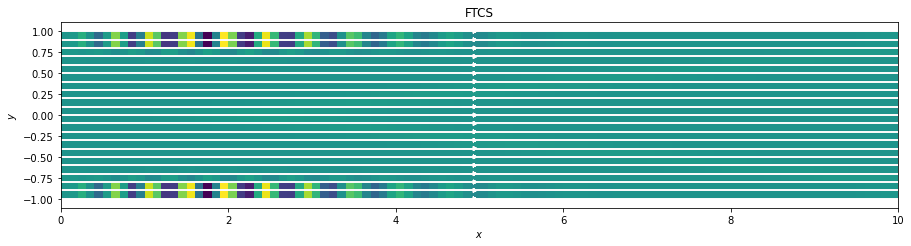

In [38]:
from matplotlib import animation
from IPython.display import HTML

# Animation Inizialization
fig = plt.figure(figsize=(15,10))
plt.title('FTCS')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
ims = []

fstep = 10
nframe = 0
while nframe < n//10:
    im = plt.imshow(rho[nframe].T, origin='lower', extent=[0,10,-1,1])
    plt.streamplot(X,Y,vx[nframe].T,vy[nframe].T, density=.7, linewidth=0.3, color='white')
    #plt.quiver(X, Y, vx[nframe].T, vy[nframe].T, color='white', width=0.001)
    ims.append([im])
    nframe += fstep


ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)


HTML(ani.to_jshtml())

---
## Ejemplo 2

En el segundo ejemplo solamente evolucionaremos la función de densidad utilizando un campo de velocidades fijo diferente al anterior.

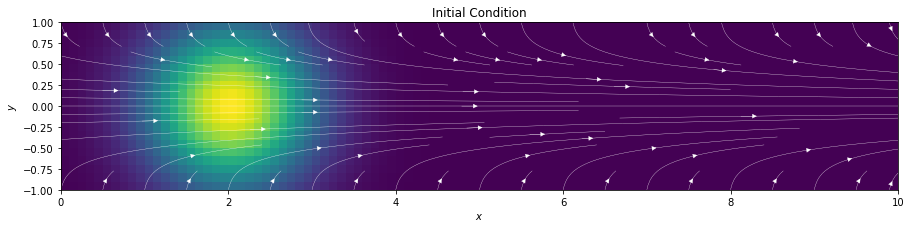

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

# In all objects, we will consider the first index as the x-component 
# and the second index as the y-component!


def gaussian2D(X, Y, x0=2, y0=.0):
    sigma2 = 0.5
    z = np.exp(-((X.T-x0)**2 + (Y.T-y0)**2)/(2*sigma2))
    return z

def initVel(X, Y):
    vx0 = 0.01*np.exp(-Y.T**2/0.25)
    vy0 = -0.001*Y.T
    return np.array([vx0, vy0])


xgrid = np.linspace(0,10,100) 
ygrid = np.linspace(-1,1,20) 
X, Y = np.meshgrid(xgrid, ygrid)

# Initial Conditions
rho0 = gaussian2D(X,Y)
v0 = initVel(X,Y)


# Plot the intial condition
plt.figure(figsize=(15,10))
plt.title('Initial Condition')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')

plt.imshow(rho0.T, origin='lower', extent=[0,10,-1,1])
#plt.quiver(X, Y, v0[0], v0[1], color='white', width=0.001)
plt.streamplot(X,Y,v0[0].T,v0[1].T, density=.7, linewidth=0.3, color='white')
plt.show()

In [27]:
n = 2000 
tgrid = np.linspace(0,800,n)
rho, vx, vy = FTCS(rho0, v0, tgrid, xgrid, ygrid)

FTCS Method
dt =  0.400200100050025
dx =  0.10101010101010101
dy =  0.10526315789473684


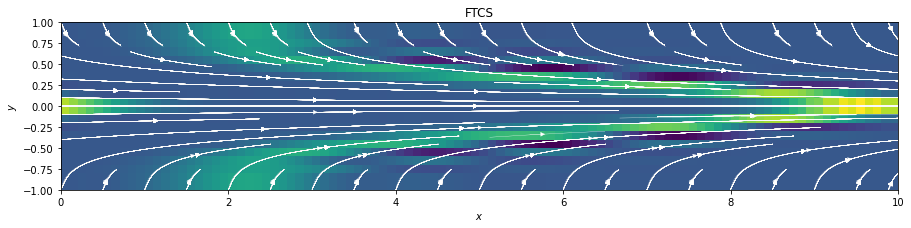

In [28]:
from matplotlib import animation
from IPython.display import HTML

# Animation Inizialization
fig = plt.figure(figsize=(15,10))
plt.title('FTCS')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
ims = []


fstep = 50
nframe = 0
while nframe < n:
    im = plt.imshow(rho[nframe].T, origin='lower', extent=[0,10,-1,1])
    plt.streamplot(X,Y,vx[nframe].T,vy[nframe].T, density=.7, linewidth=0.3, color='white')
    ims.append([im])
    nframe += fstep

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)


HTML(ani.to_jshtml())

---
## Ejemplo 3

Ahora consideramos el problema completo, con evolución del campo de velocidades.

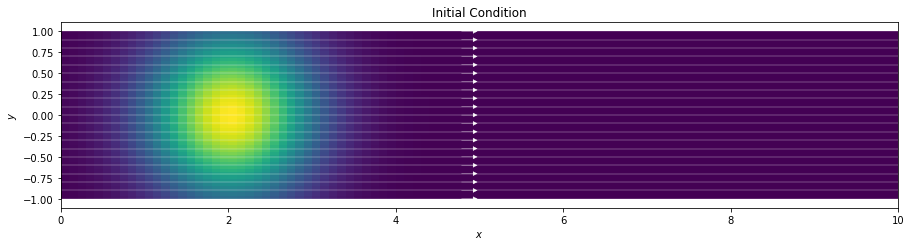

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

# In all objects, we will consider the first index as the x-component 
# and the second index as the y-component!


def gaussian2D(X, Y, x0=2., y0=0.):
    '''Initial gaussian profile for the density'''
    sigma2 = 0.5
    z = np.exp(-((X.T-x0)**2 + (Y.T-y0)**2)/(2*sigma2))
    return z

def initVel(X, Y):
    '''Constant (in time) velocity field'''
    vx0 = 10.*abs(Y.T)
    vy0 = 0.*X.T
    return np.array([vx0, vy0])


# Spatial grids
xgrid = np.linspace(0,10,100) 
ygrid = np.linspace(-1,1,50) 
X, Y = np.meshgrid(xgrid, ygrid)

# Initial Conditions
rho0 = gaussian2D(X,Y)
v0 = initVel(X,Y)


# Plot the intial condition
plt.figure(figsize=(15,10))
plt.title('Initial Condition')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')

plt.imshow(rho0.T, origin='lower', extent=[0,10,-1,1])
#ax.quiver(X, Y, vx0, vy0, color='white', width=0.001)
plt.streamplot(X,Y,v0[0].T,v0[1].T, density=.7, linewidth=0.3, color='white')
plt.show()

In [1]:
# FTCS Method
def FTCS(init_profile, init_vel, tgrid, xgrid, ygrid):
    print('FTCS Method')
    dt = tgrid[1] - tgrid[0]
    dx = xgrid[1] - xgrid[0]
    dy = ygrid[1] - ygrid[0]
    print('dt = ', dt)
    print('dx = ', dx)
    print('dy = ', dy)

    rho = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    vx = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    vy = np.zeros([len(tgrid), len(xgrid), len(ygrid)])
    rho[0] = init_profile # initial condition
    vx[0] = init_vel[0]
    vy[0] = init_vel[1]
    for n in range(len(tgrid)-1):
        for i in range(1,len(xgrid)-1):
            for j in range(1,len(ygrid)-1):
                rho[n+1,i,j] = rho[n,i,j] \
                               - (dt/(2*dx))*vx[n,i,j]*(rho[n,i+1,j] - rho[n,i-1,j]) \
                               - (dt/(2*dy))*vy[n,i,j]*(rho[n,i,j+1] - rho[n,i,j-1])
                vx[n+1,i,j] = vx[n,i,j] + dt*(- vx[n,i,j]*(vx[n,i+1,j]-vx[n,i-1,j])/(2*dx) \
                                              - vy[n,i,j]*(vx[n,i,j+1]-vx[n,i,j-1])/(2*dy) \
                                              - k*gamma*rho[n,i,j]**(gamma-2)*(rho[n,i+1,j]-rho[n,i-1,j])/(2*dx) \
                                              + nu*(vx[n,i+1,j]- 2*vx[n,i,j]+vx[n,i-1,j])/dx**2 \
                                              + nu*(vx[n,i,j+1]- 2*vx[n,i,j]+vx[n,i,j-1])/dy**2)
                vy[n+1,i,j] = vy[n,i,j] + dt*(- vx[n,i,j]*(vy[n,i+1,j]-vy[n,i-1,j])/(2*dx) \
                                              - vy[n,i,j]*(vy[n,i,j+1]-vy[n,i,j-1])/(2*dy) \
                                              - k*gamma*rho[n,i,j]**(gamma-2)*(rho[n,i,j+1]-rho[n,i,j-1])/(2*dy) \
                                              + nu*(vy[n,i+1,j]- 2*vy[n,i,j]+vy[n,i-1,j])/dx**2 \
                                              + nu*(vy[n,i,j+1]- 2*vy[n,i,j]+vy[n,i,j-1])/dy**2)
        # Outflow boundary conditions (up and down)
        rho[n+1,:,0] = rho[n+1,:,1]
        rho[n+1,:,-1] = rho[n+1,:,-2]
        vx[n+1,:,0] = vx[n+1,:,1]
        vx[n+1,:,-1] = vx[n+1,:,-2]
        vy[n+1,:,0] = vy[n+1,:,1]
        vy[n+1,:,-1] = vy[n+1,:,-2]
        # Periodic boudnary conditions (left and right)
        rho[n+1,0,:] = rho[n+1,-2,:]
        rho[n+1,-1,:] = rho[n+1,-2,:]
        vx[n+1,0,:] = vx[n+1,-2,:]
        vx[n+1,-1,:] = vx[n+1,-2,:]
        vy[n+1,0,:] = vy[n+1,-2,:]
        vy[n+1,-1,:] = vy[n+1,-2,:]
    return rho, vx, vy

In [32]:
k = 0.001
gamma =5./3.
nu = 0

n = 1000
tgrid = np.linspace(0,1,n)
rho, vx, vy = FTCS(rho0, v0, tgrid, xgrid, ygrid)

FTCS Method
dt =  0.001001001001001001
dx =  0.10101010101010101
dy =  0.04081632653061229


/var/folders/rg/9mmttz3x0hz3mvcrk2c92x_h0000gn/T/ipykernel_15191/2061612429.py:25: RuntimeWarning: invalid value encountered in double_scalars
  - k*gamma*rho[n,i,j]**(gamma-2)*(rho[n,i+1,j]-rho[n,i-1,j])/(2*dx) \
/var/folders/rg/9mmttz3x0hz3mvcrk2c92x_h0000gn/T/ipykernel_15191/2061612429.py:30: RuntimeWarning: invalid value encountered in double_scalars
  - k*gamma*rho[n,i,j]**(gamma-2)*(rho[n,i,j+1]-rho[n,i,j-1])/(2*dy) \


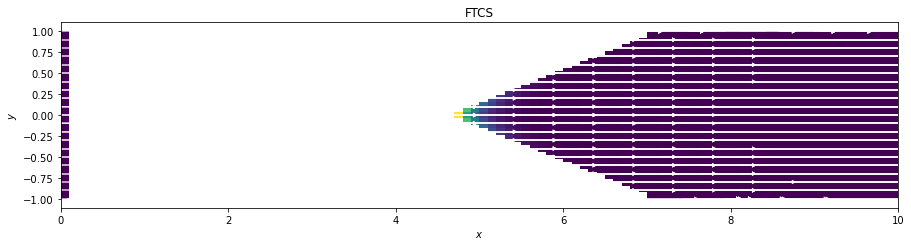

In [36]:
from matplotlib import animation
from IPython.display import HTML

# Animation Inizialization
fig = plt.figure(figsize=(15,10))
plt.title('FTCS')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
ims = []

fstep = 5
nframe = 0
while nframe < n//10:
    im = plt.imshow(rho[nframe].T, origin='lower', extent=[0,10,-1,1])
    plt.streamplot(X,Y,vx[nframe].T,vy[nframe].T, density=.7, linewidth=0.3, color='white')
    ims.append([im])
    nframe += fstep

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)


HTML(ani.to_jshtml())

---
## Ejemplo 4

Finalmente consideramos otro problema completo, con evolución del campo de velocidades.

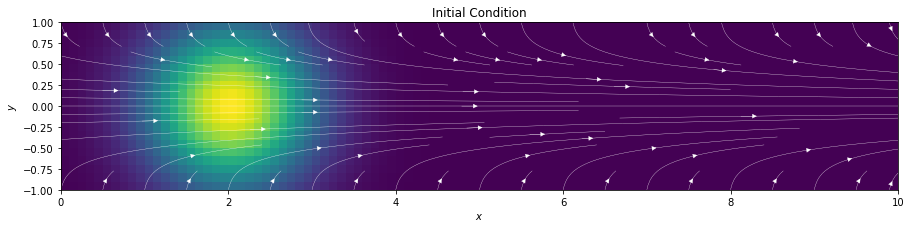

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
%matplotlib inline

# In all objects, we will consider the first index as the x-component 
# and the second index as the y-component!


def gaussian2D(X, Y, x0=2, y0=.0):
    sigma2 = 0.5
    z = np.exp(-((X.T-x0)**2 + (Y.T-y0)**2)/(2*sigma2))
    return z

def initVel(X, Y):
    vx0 = 0.01*np.exp(-Y.T**2/0.25)
    vy0 = -0.001*Y.T
    return np.array([vx0, vy0])


xgrid = np.linspace(0,10,100) 
ygrid = np.linspace(-1,1,20) 
X, Y = np.meshgrid(xgrid, ygrid)

# Initial Conditions
rho0 = gaussian2D(X,Y)
v0 = initVel(X,Y)


# Plot the intial condition
plt.figure(figsize=(15,10))
plt.title('Initial Condition')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')

plt.imshow(rho0.T, origin='lower', extent=[0,10,-1,1])
#ax.quiver(X, Y, vx0, vy0, color='white', width=0.001)
plt.streamplot(X,Y,v0[0].T,v0[1].T, density=.7, linewidth=0.3, color='white')
plt.show()

In [3]:
k = 0.001
gamma =5./3.
nu = 0

n = 1000
tgrid = np.linspace(0,10,n)
rho, vx, vy = FTCS(rho0, v0, tgrid, xgrid, ygrid)

FTCS Method
dt =  0.01001001001001001
dx =  0.10101010101010101
dy =  0.10526315789473684


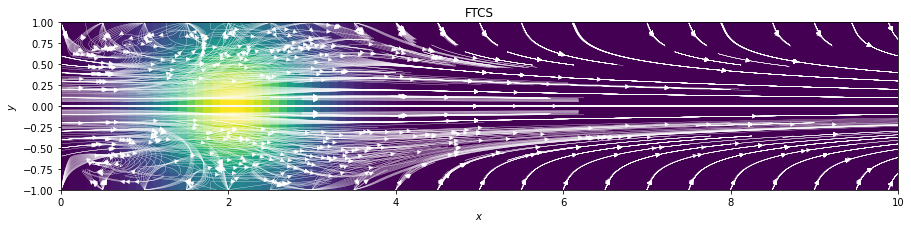

In [5]:
from matplotlib import animation
from IPython.display import HTML

# Animation Inizialization
fig = plt.figure(figsize=(15,10))
plt.title('FTCS')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
ims = []

fstep = 10
nframe = 0
while nframe < n//4:
    im = plt.imshow(rho[nframe].T, origin='lower', extent=[0,10,-1,1])
    plt.streamplot(X,Y,vx[nframe].T,vy[nframe].T, density=.7, linewidth=0.3, color='white')
    ims.append([im])
    nframe += fstep

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)


HTML(ani.to_jshtml())

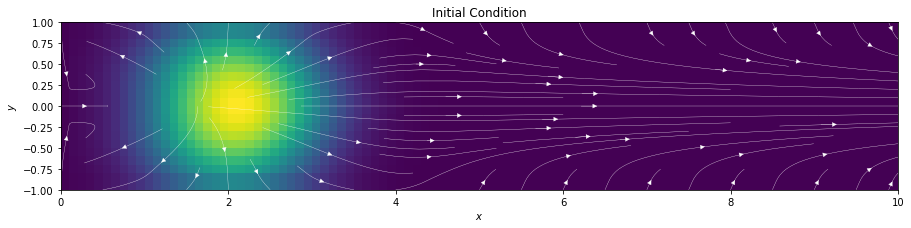

In [13]:
# Plot the intial condition
plt.figure(figsize=(15,10))
plt.title('Initial Condition')
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')

time=850
plt.imshow(rho[time].T, origin='lower', extent=[0,10,-1,1])
plt.streamplot(X,Y,vx[time].T,vy[time].T, density=.7, linewidth=0.3, color='white')
plt.show()

In [20]:
len(ims)

20